# CBCF Wind Warning Polygons

## Step 1

In [2]:
import numpy as np
from netCDF4 import Dataset, num2date

ncfile = "era5_19710411_europe.nc"
ds = Dataset(ncfile)

lat = ds.variables["latitude"][:]
lon = ds.variables["longitude"][:]
lon2d, lat2d = np.meshgrid(lon, lat)

u10 = ds.variables["u10"][:]   # (time, lat, lon)
v10 = ds.variables["v10"][:]

# --- find the time variable ---
time_var_name = "time"
if "time" not in ds.variables:
    for cand in ["valid_time", "forecast_time", "initial_time", "step"]:
        if cand in ds.variables:
            time_var_name = cand
            break

time_var = ds.variables[time_var_name]
times = num2date(time_var[:], time_var.units) if hasattr(time_var, "units") else np.arange(len(time_var[:]))

# pick one timestep
tidx = 0
u = u10[tidx, :, :]
v = v10[tidx, :, :]
ds.close()

def wind_speed(u, v): 
    return np.sqrt(u*u + v*v)

wsp = wind_speed(u, v)
print("Loaded:", ncfile, "with time variable:", time_var_name, "->", times[tidx])


Loaded: era5_19710411_europe.nc with time variable: valid_time -> 1971-04-11 00:00:00


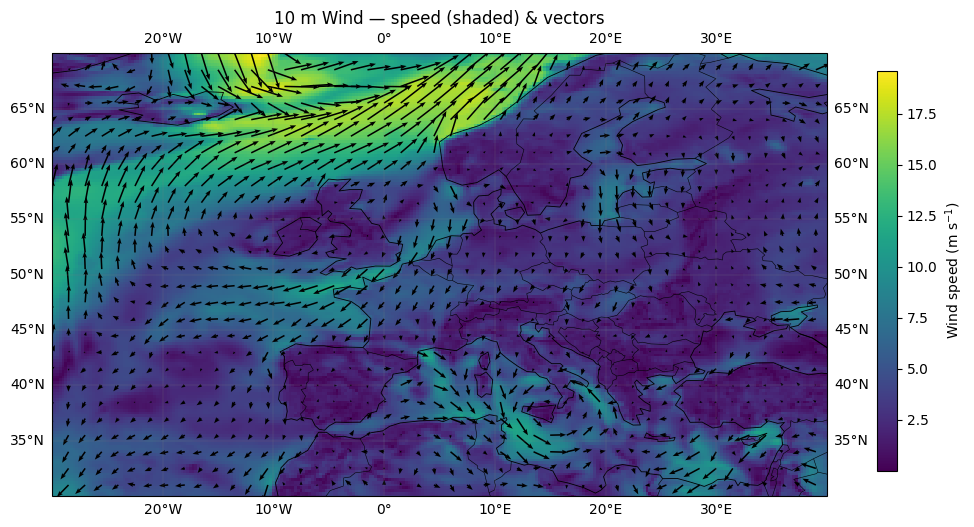

In [3]:
# === Plot wind speed with vectors + properly sized colorbar ===
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# ------------------------------------------------------------
# Map projection + figure/axes setup
# ------------------------------------------------------------
proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(10, 8))
ax = plt.axes(projection=proj)

# ------------------------------------------------------------
# Background shading: wind speed as color field
# - pcolormesh expects 2D lon/lat grids + 2D data
# - shading="auto" avoids dimension mismatch warnings
# ------------------------------------------------------------
pm = ax.pcolormesh(
    lon2d, lat2d, wsp,
    cmap="viridis",
    transform=proj,
    shading="auto"
)

# ------------------------------------------------------------
# Subsample vectors so the plot stays readable
# - target is about 35x35 arrows (rough heuristic)
# ------------------------------------------------------------
ny, nx = u.shape
stride = max(1, int(np.sqrt((nx * ny) / (35 * 35))))

ax.quiver(
    lon2d[::stride, ::stride], lat2d[::stride, ::stride],
    u[::stride, ::stride],     v[::stride, ::stride],
    transform=proj,
    scale=400,          # larger -> shorter arrows
    width=0.002,        # shaft width
    headwidth=3,
    headlength=4,
    headaxislength=3.5
)

# ------------------------------------------------------------
# Map decorations: coastlines, borders, grid lines with labels
# ------------------------------------------------------------
ax.add_feature(cfeature.COASTLINE.with_scale("110m"), linewidth=0.6)
ax.add_feature(cfeature.BORDERS.with_scale("110m"), linewidth=0.4)

ax.gridlines(
    draw_labels=True,
    linewidth=0.3,
    color="gray",
    alpha=0.5
)

# ------------------------------------------------------------
# Set map extent to the data domain
# (min/max from lon2d / lat2d)
# ------------------------------------------------------------
ax.set_extent(
    [lon2d.min(), lon2d.max(), lat2d.min(), lat2d.max()],
    crs=proj
)

plt.title("10 m Wind — speed (shaded) & vectors")

# ------------------------------------------------------------
# Custom colorbar axis placed manually
# - coordinates are figure-relative: [left, bottom, width, height]
# - this creates a shorter, nicely positioned colorbar
# ------------------------------------------------------------
cax = fig.add_axes([0.95, 0.25, 0.02, 0.5])  # right side, centered, shorter
cb = plt.colorbar(pm, cax=cax)
cb.set_label("Wind speed (m s$^{-1}$)")

plt.show()


## Step 2

In [5]:
import folium

# ------------------------------------------------------------
# Mark locations where wind speed exceeds a warning threshold
# ------------------------------------------------------------
v_warn = 10.0  # threshold in m/s
mask = wsp > v_warn

# ------------------------------------------------------------
# Create a base map
# Center map at mean lat/lon of the domain
# ------------------------------------------------------------
center = [lat.mean(), lon.mean()]
m = folium.Map(location=center, zoom_start=4, tiles="OpenStreetMap")

# ------------------------------------------------------------
# Add exceedance points as circle markers
# - zip(...) iterates through all grid points where mask=True
# - popup shows the wind speed value at that point
# ------------------------------------------------------------
for la, lo, val in zip(lat2d[mask], lon2d[mask], wsp[mask]):
    folium.CircleMarker(
        location=[la, lo],
        radius=2,
        color="red",
        fill=True,
        fill_opacity=0.1,
        popup=f"{val:.1f} m/s"
    ).add_to(m)

# show map (in Jupyter this renders interactively)
m


## Step 3

In [23]:
#!pip install scikit-image

Number of polygons found: 18


,geometry
0,"POLYGON ((-30 58.2747, -29.75 58.35479, -29.56..."
1,"POLYGON ((-8.90846 70, -8.75 69.92661, -8.5 69..."
2,"POLYGON ((-3.78888 70, -3.75 69.99273, -3.5 69..."
3,"POLYGON ((0.22383 70, 0.25 69.99138, 0.5 69.89..."
4,"POLYGON ((32.0748 70, 32 69.96812, 31.75 69.88..."


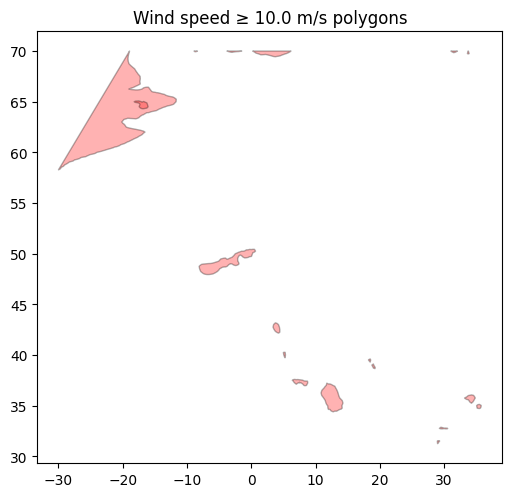

In [9]:
import numpy as np
import geopandas as gpd
from shapely.geometry import Polygon
from skimage import measure
import matplotlib.pyplot as plt

def threshold_polygons(lon2d, lat2d, field, thresh):
    """
    Extract polygons for field >= thresh using skimage.measure.find_contours.

    Method:
      - find_contours() works on a 2D array and returns contour lines
        (in index coordinates: row, col)
      - we map those indices back to lon/lat coordinates
      - then convert each contour line into a Shapely Polygon

    Returns:
      GeoDataFrame of polygons in geographic coordinates (EPSG:4326).
    """
    # ------------------------------------------------------------
    # Normalize / guarantee numpy array
    # ------------------------------------------------------------
    field = np.array(field)

    # ------------------------------------------------------------
    # Find contour lines at the threshold level
    # Each contour is an array with columns [row_index, col_index]
    # ------------------------------------------------------------
    contours = measure.find_contours(field, level=thresh)

    polys = []
    for contour in contours:
        # contour gives indices (row, col) in the field array
        rows, cols = contour[:, 0], contour[:, 1]

        # --------------------------------------------------------
        # Map row/col indices back to latitude/longitude coordinates
        # Assumes:
        #   - lat2d varies along rows and is constant in x-direction
        #   - lon2d varies along columns and is constant in y-direction
        # --------------------------------------------------------
        lats = np.interp(rows, np.arange(field.shape[0]), lat2d[:, 0])
        lons = np.interp(cols, np.arange(field.shape[1]), lon2d[0, :])

        # Build polygon coordinate list (lon, lat)
        coords = list(zip(lons, lats))

        # --------------------------------------------------------
        # Only accept valid polygon candidates
        # (need at least 3 vertices and valid geometry)
        # --------------------------------------------------------
        if len(coords) >= 3:
            poly = Polygon(coords)
            if poly.is_valid and not poly.is_empty:
                polys.append(poly)

    # return as GeoDataFrame with correct geographic CRS
    return gpd.GeoDataFrame(geometry=polys, crs="EPSG:4326")


# ============================================================
# Usage example
# ============================================================
v_warn = 10.0  # threshold in m/s
gdf_polys = threshold_polygons(lon2d, lat2d, wsp, v_warn)

print("Number of polygons found:", len(gdf_polys))
display(gdf_polys.head())

# ------------------------------------------------------------
# Quick static plot using GeoPandas built-in plotting
# ------------------------------------------------------------
ax = gdf_polys.plot(
    facecolor="red",
    edgecolor="black",
    alpha=0.3,
    figsize=(6, 6)
)
ax.set_title(f"Wind speed ≥ {v_warn} m/s polygons")
plt.show()

## Step 4

In [10]:
# ------------------------------------------------------------
# Re-use the map settings (center + zoom) to build a second map
# ------------------------------------------------------------
m2 = folium.Map(location=center, zoom_start=4, tiles="OpenStreetMap")

# ------------------------------------------------------------
# Add the polygon GeoDataFrame as a GeoJSON overlay
# - GeoPandas geometry is converted to GeoJSON internally
# - style_function controls line/fill styling for each polygon
# ------------------------------------------------------------
folium.GeoJson(
    gdf_polys,
    style_function=lambda feature: {
        "color": "blue",     # polygon outline color
        "weight": 2,         # outline thickness
        "fillOpacity": 0.2   # transparency of polygon fill
    }
).add_to(m2)

# show interactive map (Jupyter renders it automatically)
m2